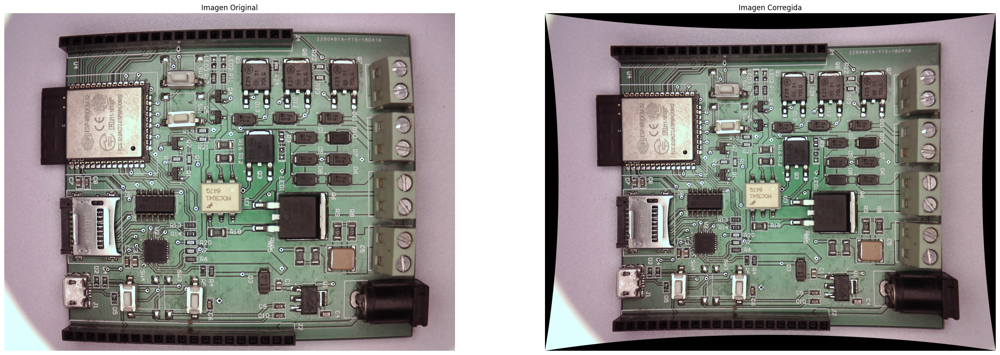

In [20]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Cargar imagen
#imagen_path = r"C:\Users\hgera\Pictures\Camera Roll\WIN_20250328_14_07_08_Pro (2).jpg"
imagen_path = r"C:\Users\hgera\Pictures\Camera Roll\WIN_20250331_14_14_12_Pro.jpg"
imagen = cv2.imread(imagen_path)

# Tamaño de la imagen
h, w = imagen.shape[:2]

# Matriz de cámara aproximada (suponiendo un sensor con centro óptico en el medio)
fx = fy = w  # Puedes ajustar estos valores si es necesario
cx, cy = w // 2, h // 2  # Punto central de la imagen
mtx = np.array([[fx, 0, cx], [0, fy, cy], [0, 0, 1]])

# Coeficientes de distorsión ajustables
dist = np.array([-0.25, 0, 0, 0, 0])  # Prueba con diferentes valores

# Corregir la imagen
new_mtx, roi = cv2.getOptimalNewCameraMatrix(mtx, dist, (w, h), 1, (w, h))
imagen_corregida = cv2.undistort(imagen, mtx, dist, None, new_mtx)

# Mostrar imágenes
fig, axs = plt.subplots(1, 2, figsize=(30 ,15 ))
axs[0].imshow(cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB))
axs[0].set_title("Imagen Original")
axs[0].axis("off")

axs[1].imshow(cv2.cvtColor(imagen_corregida, cv2.COLOR_BGR2RGB))
axs[1].set_title("Imagen Corregida")
axs[1].axis("off")

plt.show()


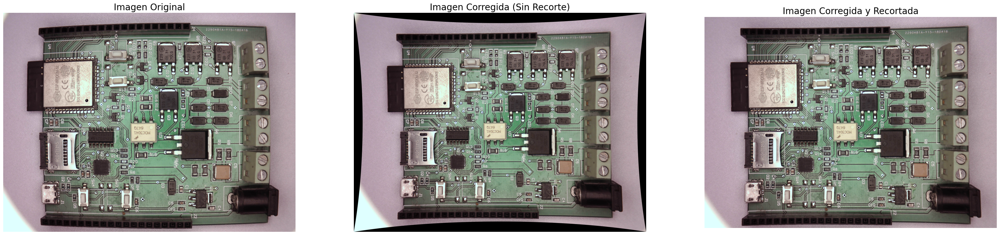

True

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Cargar imagen
imagen_path = r"C:\Users\hgera\Pictures\Camera Roll\WIN_20250331_14_14_12_Pro.jpg"
imagen = cv2.imread(imagen_path)

# Tamaño de la imagen
h, w = imagen.shape[:2]

# Matriz de cámara aproximada (ajústala si es necesario)
fx = fy = w  # Focal en píxeles
cx, cy = w // 2, h // 2  # Centro óptico
mtx = np.array([[fx, 0, cx], [0, fy, cy], [0, 0, 1]])

# Coeficientes de distorsión (ajústalos para mejor resultado)
dist = np.array([-0.25, 0, 0, 0, 0])  

# Corregir la imagen
new_mtx, roi = cv2.getOptimalNewCameraMatrix(mtx, dist, (w, h), 1, (w, h))
imagen_corregida = cv2.undistort(imagen, mtx, dist, None, new_mtx)

# Recortar la imagen para eliminar bordes negros
x, y, w, h = roi
imagen_recortada = imagen_corregida[y:y+h, x:x+w]  # Recorte usando ROI

# Mostrar imágenes en grande
fig, axs = plt.subplots(1, 3, figsize=(40, 15))  # Aumentamos el tamaño
axs[0].imshow(cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB))
axs[0].set_title("Imagen Original", fontsize=20)
axs[0].axis("off")

axs[1].imshow(cv2.cvtColor(imagen_corregida, cv2.COLOR_BGR2RGB))
axs[1].set_title("Imagen Corregida (Sin Recorte)", fontsize=20)
axs[1].axis("off")

axs[2].imshow(cv2.cvtColor(imagen_recortada, cv2.COLOR_BGR2RGB))
axs[2].set_title("Imagen Corregida y Recortada", fontsize=20)
axs[2].axis("off")

plt.show()

# Guardar la imagen corregida y recortada
cv2.imwrite("imagen_corregida_recortada.jpg", imagen_recortada)


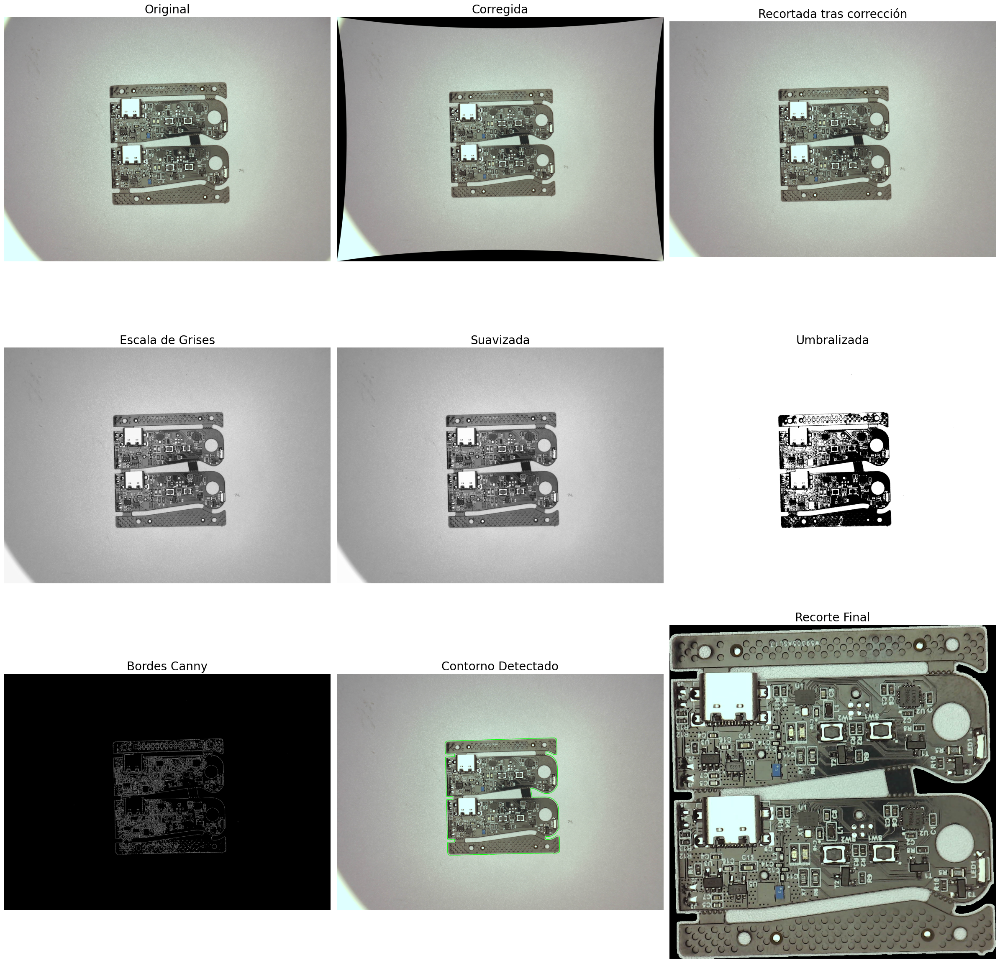

In [38]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Cargar imagen
#imagen_path = r"C:\Users\hgera\Pictures\Camera Roll\WIN_20250331_14_14_12_Pro.jpg"
#imagen_path = r"C:\Users\hgera\Pictures\Camera Roll\WIN_20250328_14_01_56_Pro (2).jpg"
imagen_path = r"C:\Users\hgera\Pictures\Camera Roll\WIN_20250331_14_18_11_Pro.jpg"
imagen = cv2.imread(imagen_path)

# Tamaño de la imagen
h, w = imagen.shape[:2]

# Matriz de cámara aproximada
fx = fy = w  # Distancia focal en píxeles
cx, cy = w // 2, h // 2  # Centro óptico de la imagen
mtx = np.array([[fx, 0, cx], [0, fy, cy], [0, 0, 1]])

# Coeficientes de distorsión
dist = np.array([-0.25, 0, 0, 0, 0])  

# Corregir la imagen
new_mtx, roi = cv2.getOptimalNewCameraMatrix(mtx, dist, (w, h), 1, (w, h))
imagen_corregida = cv2.undistort(imagen, mtx, dist, None, new_mtx)

# Obtener la región de interés (ROI) y recortar la imagen corregida
x, y, w, h = roi
imagen_corregida_recortada = imagen_corregida[y:y+h, x:x+w]

# Convertir a escala de grises
imagen_gris = cv2.cvtColor(imagen_corregida_recortada, cv2.COLOR_BGR2GRAY)

# Aplicar filtro Gaussiano para suavizar
imagen_gris_suavizada = cv2.GaussianBlur(imagen_gris, (5, 5), 0)

# Aplicar umbralización
_, imagen_umbralizada = cv2.threshold(imagen_gris, 120, 255, cv2.THRESH_BINARY)

# Aplicar Canny para detección de bordes
bordes = cv2.Canny(imagen_umbralizada, 120, 200)

# Dilatar bordes para mejorar la detección de contornos
kernel = np.ones((15, 15), np.uint8)
bordes_dilatados = cv2.dilate(bordes, kernel, iterations=1)

# Encontrar contornos
contornos, _ = cv2.findContours(bordes_dilatados, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)

# Seleccionar el contorno más grande
contorno_mas_grande = max(contornos, key=cv2.contourArea)

# Dibujar el contorno en la imagen corregida recortada
imagen_con_contorno = imagen_corregida_recortada.copy()
cv2.drawContours(imagen_con_contorno, [contorno_mas_grande], -1, (0, 255, 0), 3)

# Crear máscara en negro
mascara = np.zeros(imagen_corregida_recortada.shape[:2], dtype="uint8")

# Dibujar el contorno en la máscara
cv2.drawContours(mascara, [contorno_mas_grande], -1, 255, thickness=cv2.FILLED)

# Aplicar máscara a la imagen corregida recortada
imagen_recortada = cv2.bitwise_and(imagen_corregida_recortada, imagen_corregida_recortada, mask=mascara)

# Obtener la caja delimitadora del contorno
x, y, w, h = cv2.boundingRect(contorno_mas_grande)

# Recortar la imagen final con el contorno delimitado
imagen_final_recortada = imagen_recortada[y:y+h, x:x+w]

# Mostrar todas las imágenes en una tabla 3x3
fig, axs = plt.subplots(3, 3, figsize=(24, 24))

imagenes = [
    ("Original", imagen), ("Corregida", imagen_corregida), ("Recortada tras corrección", imagen_corregida_recortada),
    ("Escala de Grises", imagen_gris), ("Suavizada", imagen_gris_suavizada), ("Umbralizada", imagen_umbralizada),
    ("Bordes Canny", bordes), ("Contorno Detectado", imagen_con_contorno), ("Recorte Final", imagen_final_recortada)
]

for i, (titulo, img) in enumerate(imagenes):
    fila, col = divmod(i, 3)
    if len(img.shape) == 2:
        axs[fila, col].imshow(img, cmap="gray")
    else:
        axs[fila, col].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axs[fila, col].set_title(titulo, fontsize=20)
    axs[fila, col].axis("off")

plt.tight_layout()
plt.show()
